In [1]:
import csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import ticker
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)

from scipy.stats import zscore
from sklearn.impute import KNNImputer
from scipy.spatial import distance
from scipy.interpolate import interp1d
from scipy import stats
from scipy.stats import chi2
from scipy.spatial.distance import mahalanobis

In [2]:
from pathlib import Path
print(Path.cwd())

from os import walk

#This is the folder path, replace to your own local path
dir_path = r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Sang_Code_Processing_2024\0. Raw data\Year 4Final\Desigo\Window, skylight'

file_list = []
for (dir_path, dir_names, file_names) in walk(dir_path):
    file_list.extend(file_names)
    # don't look inside any subdirectory
    break
print(file_list)

c:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Code Year4
['HZ_Z11_E_opening_060123-053124_raw.csv', 'HZ_Z11_S_opening_060123-053124_raw.csv', 'HZ_Z12_S_opening_060123-053124_raw.csv', 'HZ_Z13_S_opening_060123-053124_raw.csv', 'HZ_Z13_W_opening_060123-053124_raw.csv', 'HZ_Z15_N_opening_060123-053124_raw.csv', 'HZ_Z15_W_opening_060123-053124_raw.csv', 'HZ_Z16_N_opening_060123-053124_raw.csv', 'HZ_Z17_N_opening_060123-053124_raw.csv', 'HZ_Z1_Solar_damper_opening_060123-053124_raw.csv', 'HZ_Z1_S_opening_060123-053124_raw.csv', 'HZ_Z21_E_opening_060123-053124_raw.csv', 'HZ_Z21_Sky_opening_060123-053124_raw.csv', 'HZ_Z21_S_opening_060123-053124_raw.csv', 'HZ_Z22_S_opening_060123-053124_raw.csv', 'HZ_Z23_Sky_opening_060123-053124_raw.csv', 'HZ_Z23_S_opening_060123-053124_raw.csv', 'HZ_Z23_W_opening_060123-053124_raw.csv', 'HZ_Z24_opening_060123-053124_raw.csv', 'HZ_Z24_Sky_opening_060123-053124_raw.csv', 'HZ_Z25_N_opening_060123-053124_raw.csv', 'HZ_Z

In [3]:
#IMPORTANT: If you get an error in reading the files do the following:
import os
Lst = []
for i in range(0, len(file_list)):
    # Construct the full path for each file
    file_path = os.path.join(dir_path, file_list[i])
    # Use the full path to read the CSV file
    data = pd.read_csv(file_path, parse_dates=['Timestamp'], index_col=[0])
    filtered_df = data[data['QualityGood'] == True]
    print(len(filtered_df))
    Lst.append(filtered_df)

527260
527260
527260
527258
527258
527260
527258
527260
527258
527260
527237
527258
527255
527257
527257
527255
527258
527256
527256
527255
527255
527255
527269
527255
527257
527255
527256
527255
527257
527255
527256
527260
527259
527259


In [4]:
Lst_Temp = []
Lst_name = []
#Initialize an empty DataFrame to compile resampled data from each DataFrame in Lst
Zone_Temp = pd.DataFrame()
res = 1
#This part will take care of timestamp corrections, ensuring the output is always EST!
for i in range(0,len(Lst)):
    #Convert the index of the current DataFrame to datetime format with UTC timezone    
    Lst[i].index = pd.to_datetime(Lst[i].index, errors='coerce', utc=True, format='mixed')
    #Convert the timezone of the index from UTC to US/Eastern
    Lst[i].index = Lst[i].index.tz_convert('US/Eastern')
    #Resample the DataFrame to a 1-minute frequency using the mean for aggregation. (This is for analysis)
    #forward fill missing data resulting from the resampling.
    Lst[i] = Lst[i].resample("1T").mean().ffill()
    #Extract the name of the first column of the DataFrame.    
    zone_name = Lst[i].columns.values[0]
    Lst_name.append(zone_name)
    #Convert the specified column's data to numeric to ensure consistency for calculations.
    Z = pd.to_numeric(Lst[i][zone_name])
    Lst_Temp.append(Z.tolist())
    #Create a new column in 'Zone_Temp' with the name of the current zone.
    Zone_Temp[zone_name] = pd.Series(Z, index=Lst[i].index)
    
Zone_Temp

C:\Users\Sang\AppData\Local\Temp\ipykernel_19108\3585020869.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_19108\3585020869.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_19108\3585020869.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_19108\3585020869.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_19108\3585020869.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version,

,Z11_E_opening (%),Z11_S_opening (%),Z12_S_opening (%),Z13_S_opening (%),Z13_W_opening (%),Z15_N_opening (%),Z15_W_opening (%),Z16_N_opening (%),Z17_N_opening (%),Z1_Solar_damper_opening (%),...,Z27_N_opening (%),Z27_Sky_opening (%),Z31_Sky_opening (%),Z31_S_opening (%),Z32_W_opening (%),Z33_N_opening (%),Z33_Sky_opening (%),Z3_N_opening (%),Z4_N_opening (%),Z5_N_opening (%)
Timestamp,,,,,,,,,,,,,,,,,,,,,
2023-06-01 00:00:00-04:00,58.0,40.0,37.0,56.0,70.0,12.0,16.0,12.0,0.0,0.0,...,100.0,100.0,86.0,50.0,60.0,64.0,64.0,0.0,22.0,0.0
2023-06-01 00:01:00-04:00,58.0,40.0,37.0,56.0,70.0,12.0,16.0,12.0,0.0,0.0,...,100.0,100.0,86.0,50.0,60.0,64.0,64.0,0.0,22.0,0.0
2023-06-01 00:02:00-04:00,58.0,40.0,37.0,56.0,70.0,12.0,16.0,12.0,0.0,0.0,...,100.0,100.0,86.0,50.0,60.0,64.0,64.0,0.0,22.0,0.0
2023-06-01 00:03:00-04:00,58.0,40.0,37.0,56.0,70.0,12.0,16.0,12.0,0.0,0.0,...,100.0,100.0,86.0,50.0,60.0,64.0,64.0,0.0,22.0,0.0
2023-06-01 00:04:00-04:00,58.0,40.0,37.0,56.0,70.0,12.0,16.0,12.0,0.0,0.0,...,100.0,100.0,86.0,50.0,60.0,64.0,64.0,0.0,22.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-31 23:55:00-04:00,100.0,100.0,100.0,100.0,100.0,87.0,87.0,87.0,59.0,0.0,...,100.0,100.0,100.0,95.0,11.0,94.0,100.0,44.0,68.0,0.0
2024-05-31 23:56:00-04:00,100.0,100.0,100.0,100.0,100.0,87.0,87.0,87.0,59.0,0.0,...,100.0,100.0,100.0,95.0,11.0,94.0,100.0,44.0,68.0,0.0
2024-05-31 23:57:00-04:00,100.0,100.0,100.0,100.0,100.0,87.0,87.0,87.0,59.0,0.0,...,100.0,100.0,100.0,95.0,11.0,94.0,100.0,44.0,68.0,0.0


<Axes: xlabel='Timestamp'>

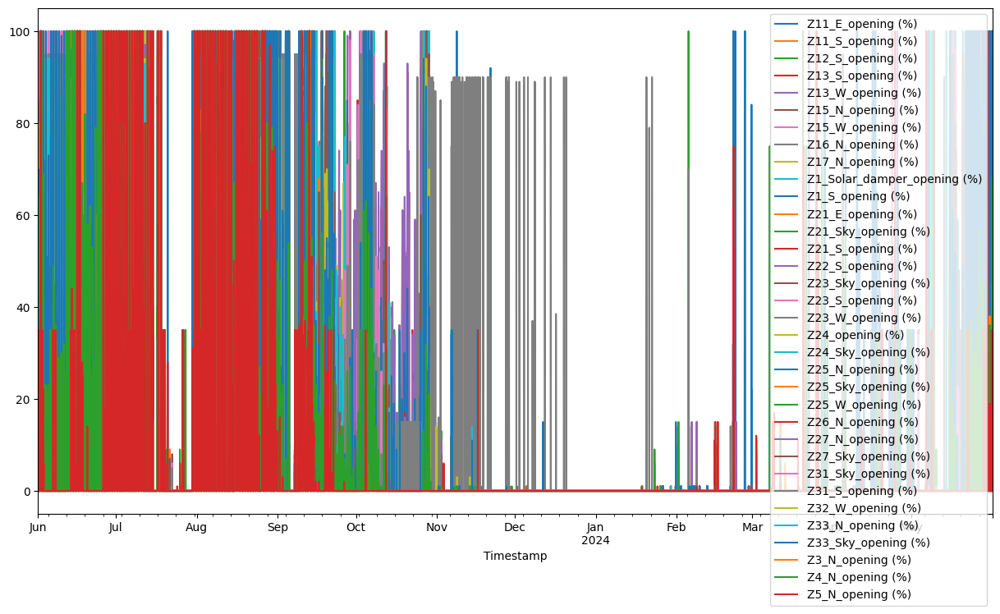

In [5]:
Zone_Temp.plot(figsize=(15, 8))

C:\Users\Sang\AppData\Local\Temp\ipykernel_19108\4279383470.py:2: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  Zone_Temp = Zone_Temp.resample("H").mean().ffill()


<Axes: xlabel='Timestamp'>

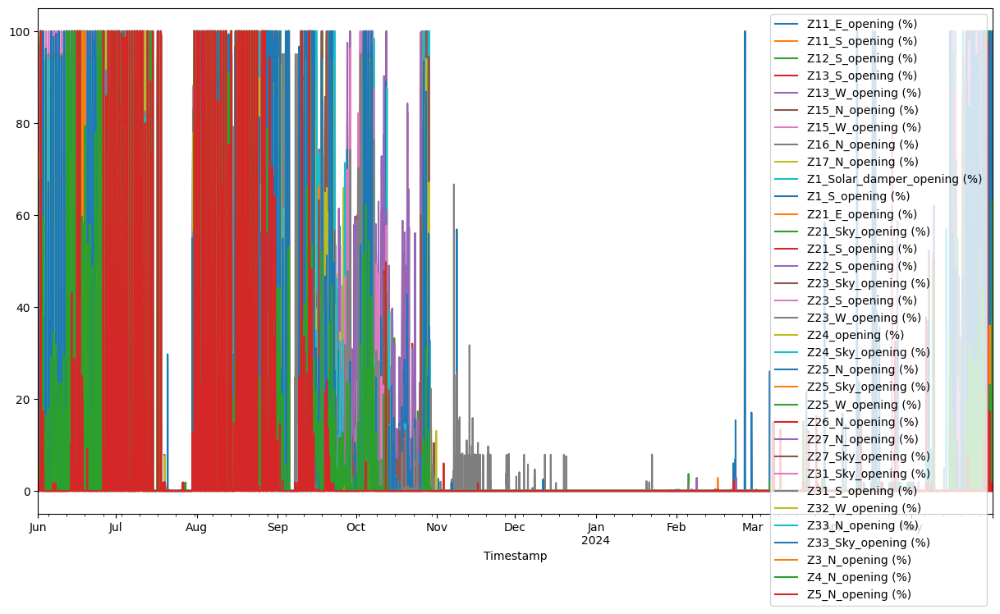

In [6]:
#Process hourly and forward fill (propagate last existing value to a missing value)
Zone_Temp = Zone_Temp.resample("H").mean().ffill()

Zone_Temp.plot(figsize=(15, 8))

c:\Users\Sang\AppData\Local\Programs\Python\Python312\Lib\site-packages\pandas\plotting\_matplotlib\core.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


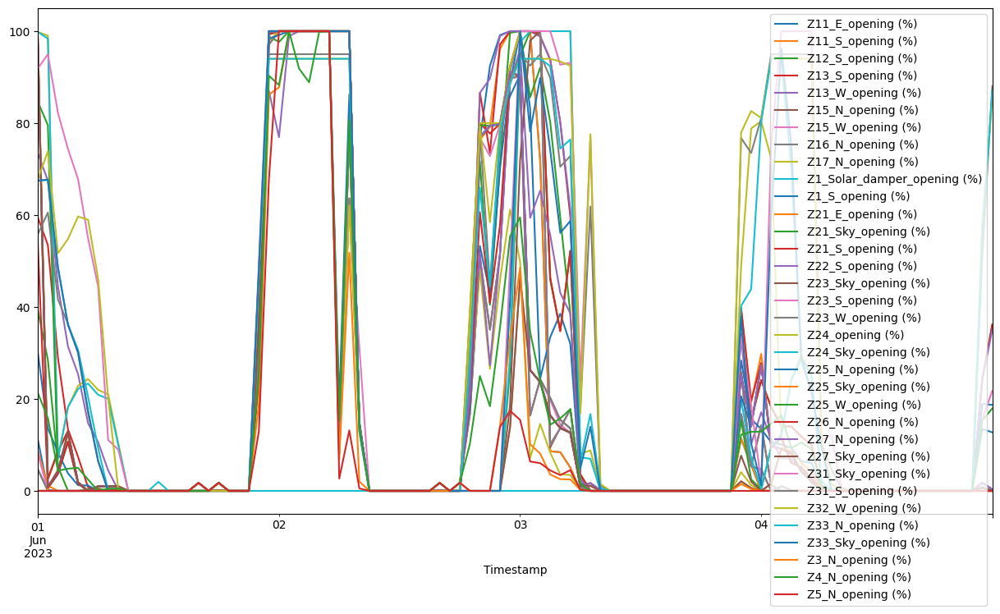

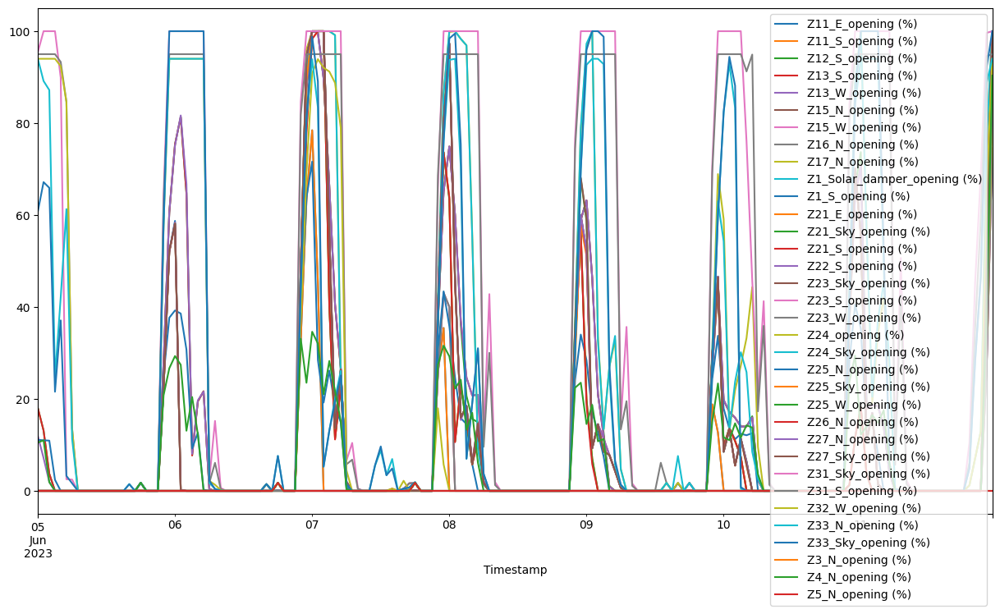

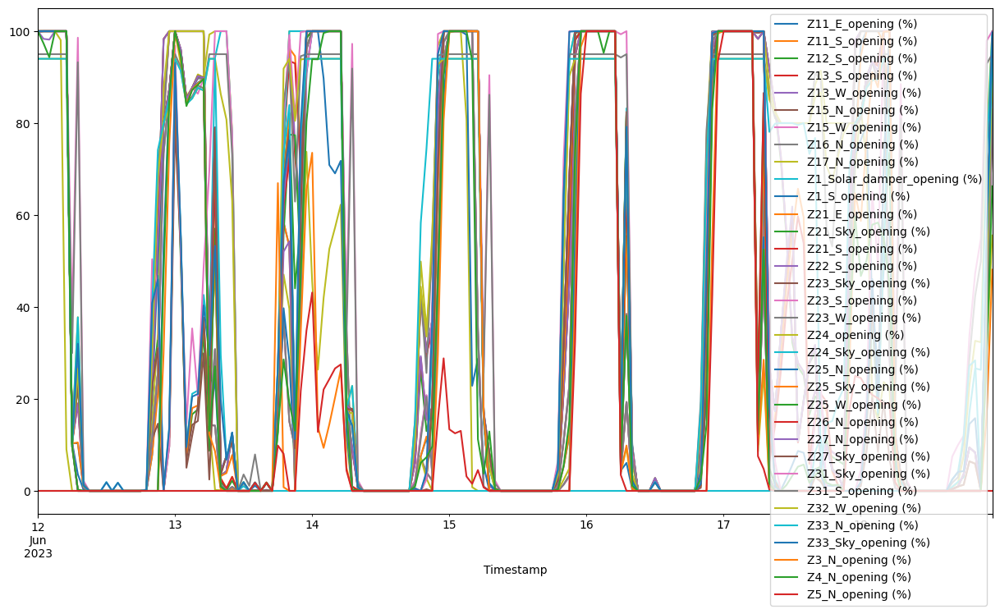

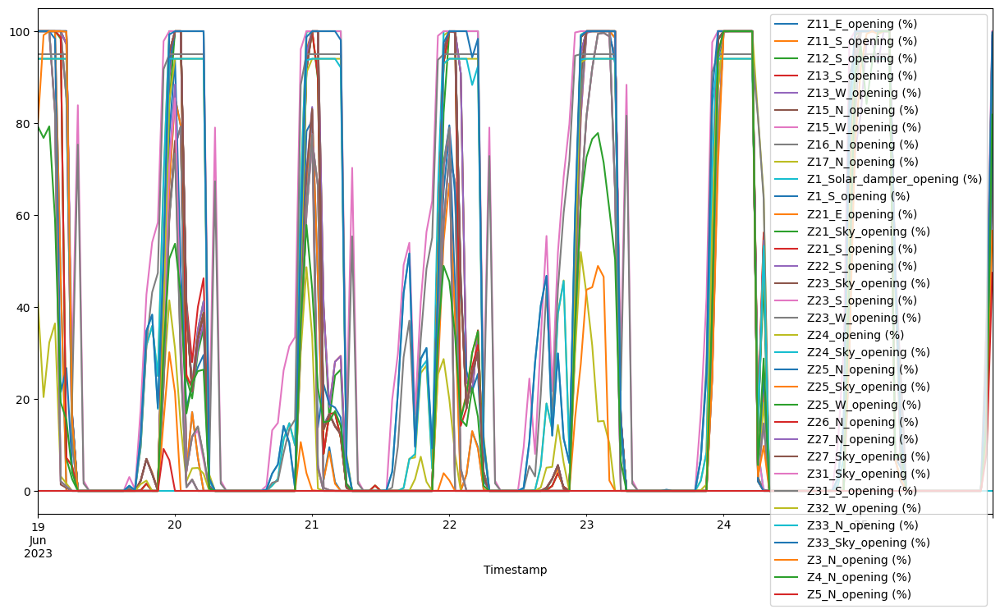

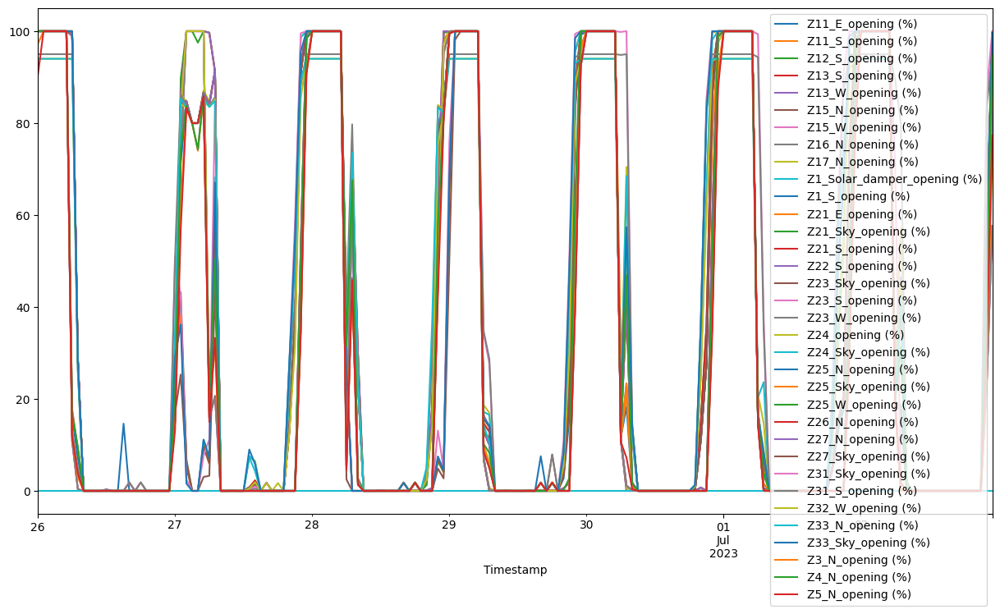

...

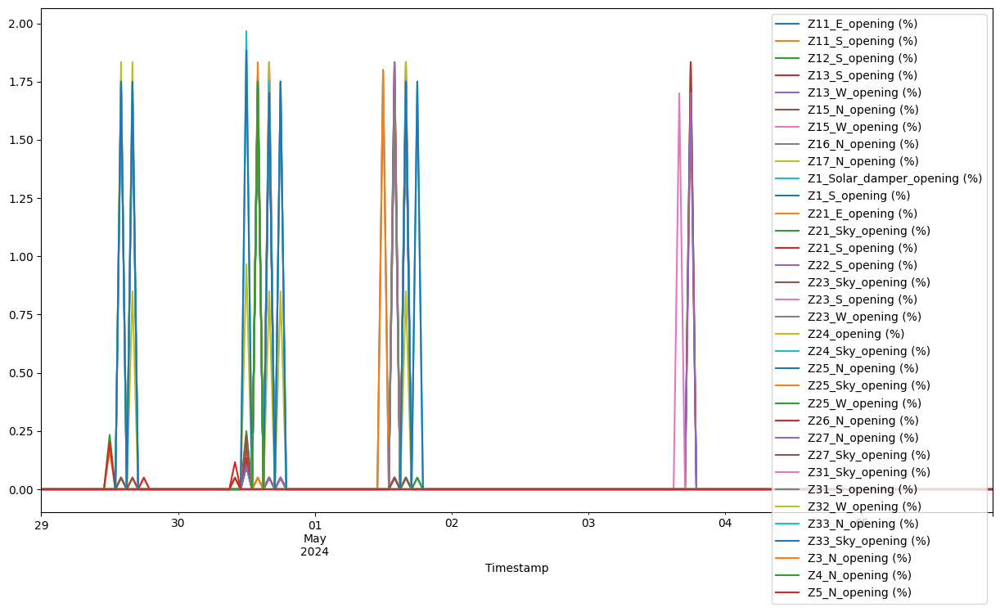

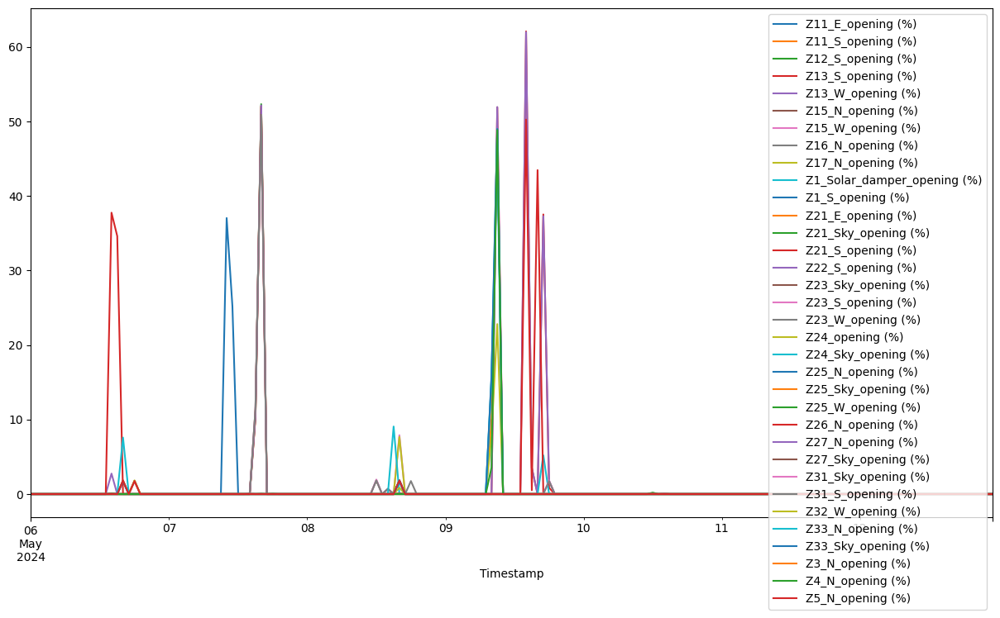

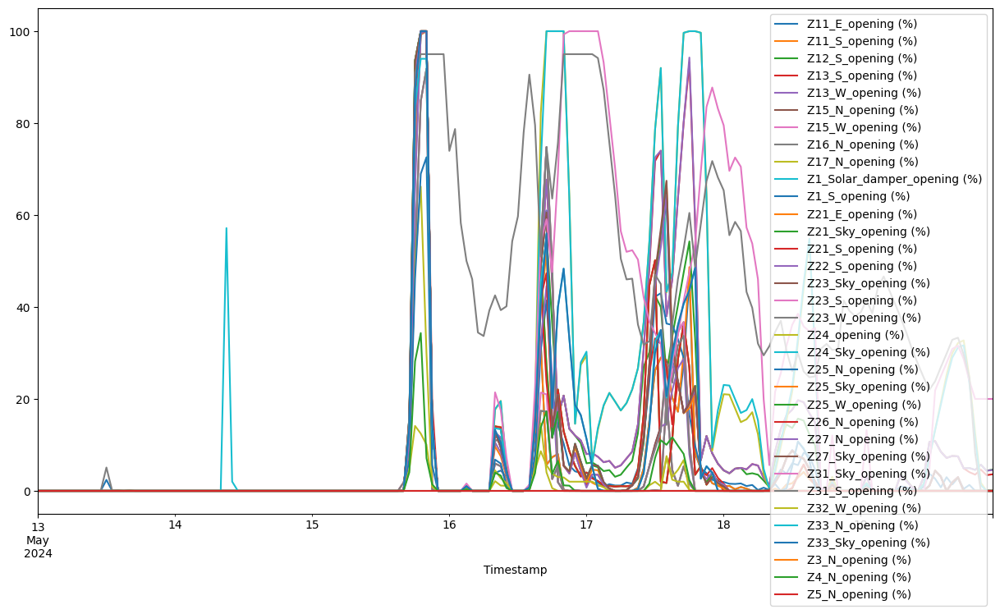

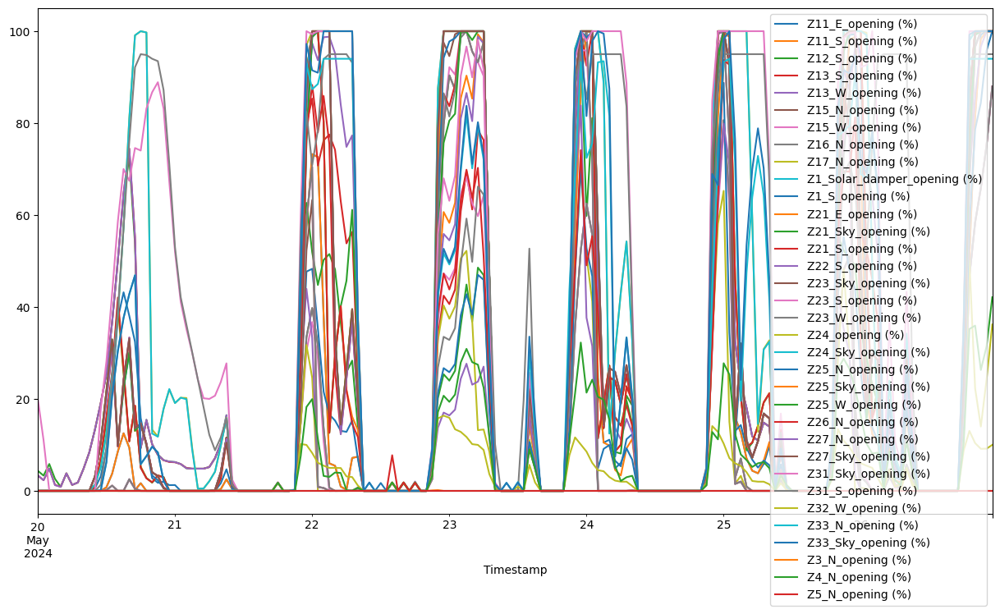

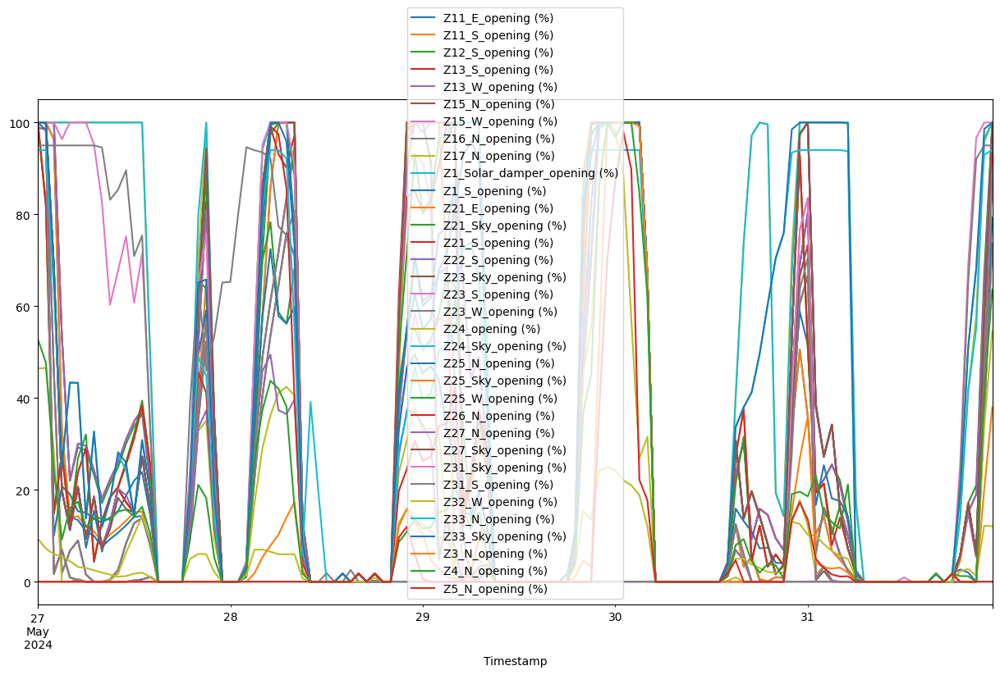

In [7]:
for (year, week), group in Zone_Temp.groupby([Zone_Temp.index.isocalendar().year, Zone_Temp.index.isocalendar().week]):

    group.plot(figsize=(15, 8))

In [8]:
#check range of timestamps
print(Zone_Temp.index.min(), Zone_Temp.index.max())

2023-06-01 00:00:00-04:00 2024-05-31 23:00:00-04:00


<Axes: xlabel='Timestamp'>

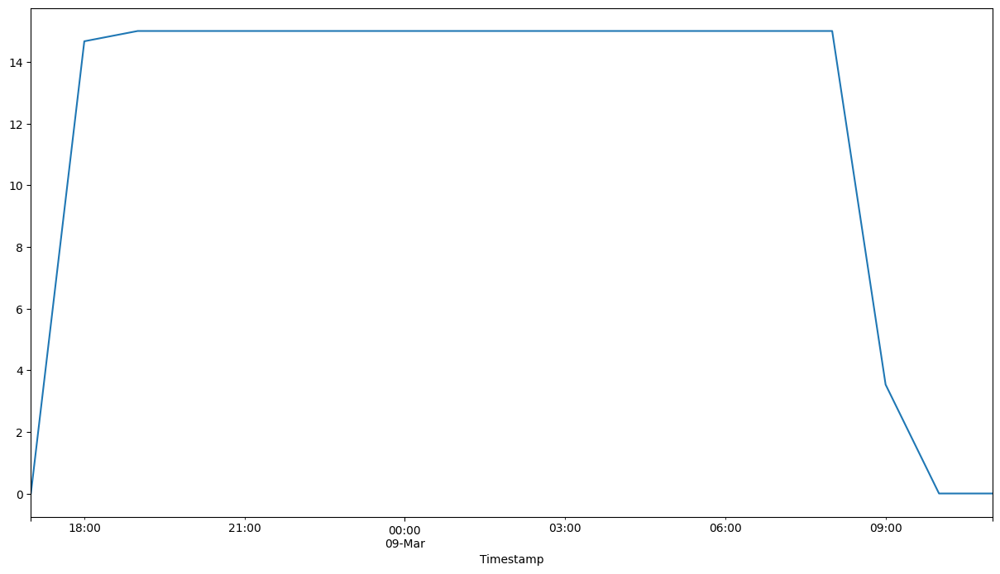

In [9]:
Zone_Temp['Z21_S_opening (%)']["2024-03-08 17:00:00":"2024-03-09 11:00:00"].plot(figsize=(15, 8))

In [10]:
Zone_Temp['Z21_S_opening (%)']["2024-03-08 17:00:00":"2024-03-09 11:00:00"] = np.nan

C:\Users\Sang\AppData\Local\Temp\ipykernel_19108\478847043.py:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  Zone_Temp['Z21_S_opening (%)']["2024-03-08 17:00:00":"2024-03-09 11:00:00"] = np.nan


<Axes: xlabel='Timestamp'>

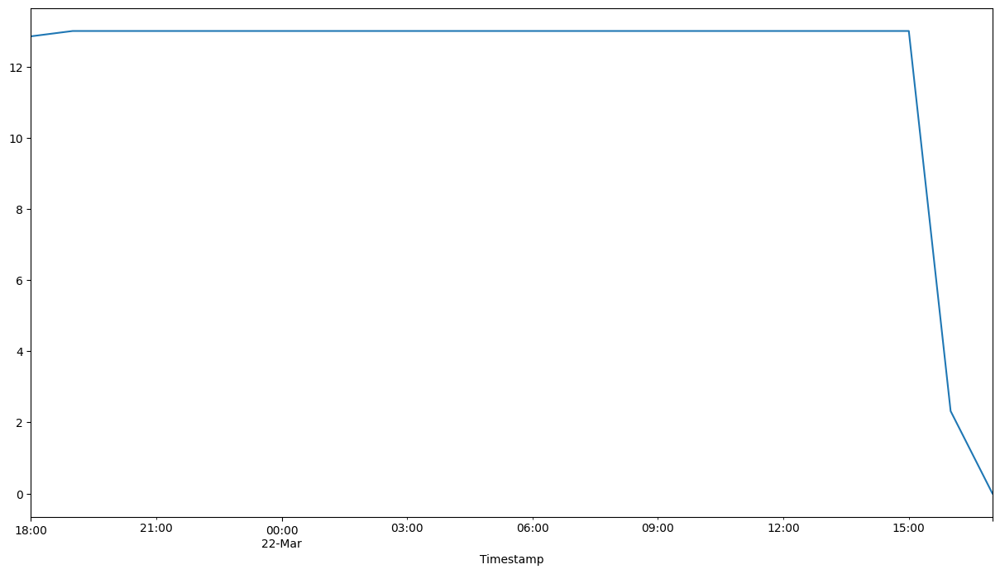

In [11]:
Zone_Temp['Z21_S_opening (%)']["2024-03-21 18:00:00":"2024-03-22 17:00:00"].plot(figsize=(15, 8))

In [12]:
Zone_Temp['Z21_S_opening (%)']["2024-03-21 18:00:00":"2024-03-22 17:00:00"] = np.nan

C:\Users\Sang\AppData\Local\Temp\ipykernel_19108\297035866.py:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  Zone_Temp['Z21_S_opening (%)']["2024-03-21 18:00:00":"2024-03-22 17:00:00"] = np.nan


<Axes: xlabel='Timestamp'>

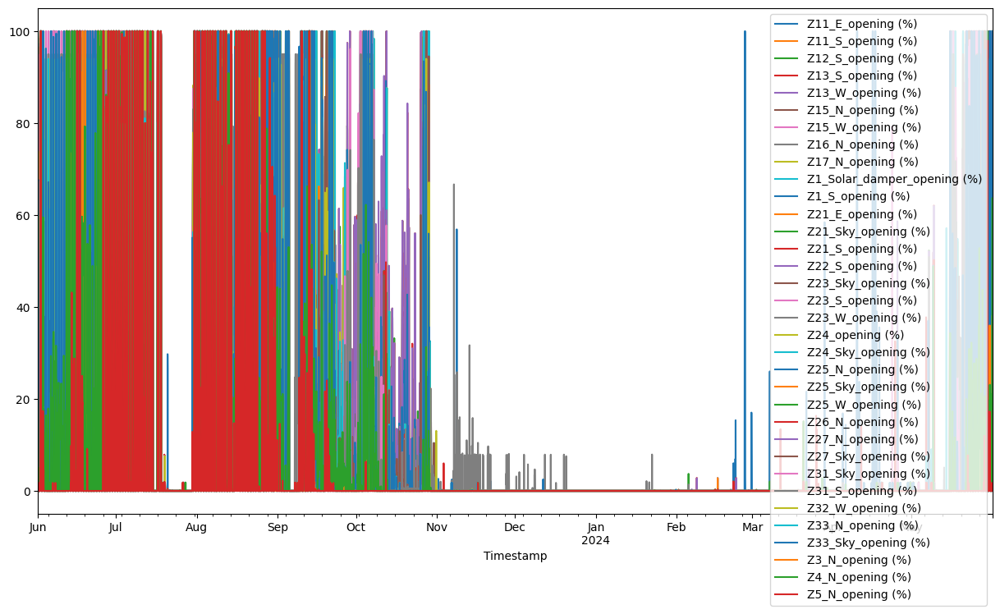

In [13]:
Zone_Temp.plot(figsize=(15, 8))

In [14]:
#Missing data check
def find_nan_sequences(series):
    is_nan = series.isna()
    if is_nan.any():
        start = end = None
        for i, val in enumerate(is_nan):
            if val and start is None:
                start = i
            elif not val and start is not None:
                end = i - 1
                yield (series.index[start], series.index[end])
                start = end = None
        if start is not None:
            yield (series.index[start], series.index[-1])

# Find and print start and end indices of NaN sequences in each column
empDF = pd.DataFrame()
LstN = []
LstS = []
LstE = []

for column in Zone_Temp.columns:
    for start, end in find_nan_sequences(Zone_Temp[column]):
        print(f"Missing period:'{column}' from {start} to {end}")
        LstN.append(column)
        LstS.append(start)
        LstE.append(end)
        
empDF["names"] = LstN
empDF["start"] = LstS
empDF["end"] = LstE

Missing period:'Z21_S_opening (%)' from 2024-03-08 17:00:00-05:00 to 2024-03-09 11:00:00-05:00
Missing period:'Z21_S_opening (%)' from 2024-03-21 18:00:00-04:00 to 2024-03-22 17:00:00-04:00


In [15]:
empDF.to_csv(r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Missing Intervals\Year4\Missing_periods_WO_Year4.csv', index=False)

In [16]:
Zone_Temp.to_csv(r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Processed\Desigo\Year4\Zone_WO_Year4.csv', index=True)